In [0]:
%pip install databricks-feature-store databricks

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.7/211.7 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.9/316.9 MB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.1/96.1 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.8/222.8 kB 39.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.5/705.5 kB 68.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 74.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.4/192.4 kB 37.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.9/97.9 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 23.6 MB/s

In [0]:
dbutils.library.restartPython()

In [0]:
from pyspark.sql.functions import pandas_udf, PandasUDFType
import pyspark.pandas as ps
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from databricks.feature_store import feature_table, FeatureStoreClient

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.pipeline import Pipeline



## Load data from Feature Store

In [0]:
fs = FeatureStoreClient()
feature_set = fs.read_table(name="hackathon.example_schema.ml_nba_game_features_small")
display(feature_set)

game_id,home_team,event_num,period,minute_game,score_margin_complete,team_leading_complete,month,day,year,momentum_40,event_type_1,event_type_2,event_type_3,event_type_4,event_type_5,event_type_6,event_type_7,event_type_8,event_type_9,event_type_10,event_type_11,event_type_12,event_type_13,event_type_18,away_team_atlanta_hawks,away_team_boston_celtics,away_team_brooklyn_nets,away_team_charlotte_hornets,away_team_chicago_bulls,away_team_cleveland_cavaliers,away_team_dallas_mavericks,away_team_denver_nuggets,away_team_detroit_pistons,away_team_golden_state_warriors,away_team_houston_rockets,away_team_indiana_pacers,away_team_los_angeles_clippers,away_team_los_angeles_lakers,away_team_memphis_grizzlies,away_team_miami_heat,away_team_milwaukee_bucks,away_team_minnesota_timberwolves,away_team_new_orleans_pelicans,away_team_new_york_knicks,away_team_oklahoma_city_thunder,away_team_orlando_magic,away_team_philadelphia_76ers,away_team_phoenix_suns,away_team_portland_trail_blazers,away_team_sacramento_kings,away_team_san_antonio_spurs,away_team_utah_jazz,away_team_washington_wizards
0011500107,Toronto_Raptors,49,1,5.0,-5,Away,10,23,2015,-5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,50,1,5.23,-5,Away,10,23,2015,-5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,52,1,5.42,-3,Away,10,23,2015,-3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,53,1,5.55,-5,Away,10,23,2015,-5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,55,1,6.05,-3,Away,10,23,2015,-3,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,56,1,6.08,-3,Away,10,23,2015,-3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,57,1,6.12,-5,Away,10,23,2015,-2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,61,1,6.53,-5,Away,10,23,2015,-2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,65,1,7.02,-4,Away,10,23,2015,-1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0011500107,Toronto_Raptors,66,1,7.22,-4,Away,10,23,2015,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


### Split into Training and Testing Sets Based on Season and Period and convert to pandas

In [0]:
# training set include any number of seasons or any data not in 4th quarter
# testing set only previous season 4th quarter (2022-23)
# drop game_id and event_num among other columns as these are the identifiers
# keep an original copy to be able to visualize actuals and predictions and filter properly for a game at the end of the notebook

# Maintain an original copy
feature_set_og = feature_set

# Drop specified columns and categorical ones
df = feature_set.drop("game_id", "event_num","home_team","team_leading_complete")

# Filter out 4th quarter data
df_no_4th_quarter = df.filter((df.period != 4)&(df.year!='2022'))

# Training data: Any number of seasons or any data not in the 4th quarter
train = df_no_4th_quarter.toPandas()
train_orig = df_no_4th_quarter.toPandas()

# Testing data: Only previous season 4th quarter (2022-23)
test = df.filter((df.period == 4) & (df.year == "2022")).toPandas()
test_orig = df.filter((df.period == 4) & (df.year == "2022")).toPandas()

### Implement Modelling
* Test out a bunch of different regression models

In [0]:
from pyspark.sql.functions import col

# y_train will be a DataFrame consisting of the 'score_margin_complete' column
y_train = train['score_margin_complete']

# X_train will be the train DataFrame but without the 'score_margin_complete' column
X_train = train.drop('score_margin_complete',axis=1)

y_test = test['score_margin_complete']
X_test = test.drop('score_margin_complete',axis=1)

In [0]:
from sklearn.model_selection import cross_val_score

models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree Regression": DecisionTreeRegressor()
    
}

cv = 5  # Number of cross validation folds
scoring = 'neg_mean_absolute_error'  # Scoring metric

all_metrics = {}

# Train and compute metrics for each model
for name, model in models.items():
    scores = cross_val_score(model, X_train, y_train, cv=cv, scoring=scoring)  
   
    # Scores returned by cross_val_score are negative as it is a loss function. 
    # The actual MAE is simply the positive version of the score.
    mae_scores = -scores
    
    # Calculate mean and standard deviation of MAE
    mae_mean = mae_scores.mean()
    mae_std = mae_scores.std()
    
    all_metrics[name] = {
        "Mean of MAE": mae_mean,
        "Std of MAE": mae_std
    }

# Print metrics
for model, metrics in all_metrics.items():
    print(f"{model}:\nMean of MAE: {metrics['Mean of MAE']}\nStd of MAE: {metrics['Std of MAE']}\n")

Linear Regression:
Mean of MAE: 6.3242548723150005
Std of MAE: 0.08881971723340416

Decision Tree Regression:
Mean of MAE: 0.8400474544852079
Std of MAE: 0.03589718416830515



### **OPTIONAL** Hyperparameter tune best model generated on baseline using all data 

In [0]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

pipeline = Pipeline(steps=[("scaler", StandardScaler()), ("dt", DecisionTreeRegressor())])

param_grid = {
    "dt__max_depth": [2, 5, 10],
    "dt__min_samples_split": [2, 5],
    "dt__min_samples_leaf": [1, 2],
}

scorers = {
    'r2_score': make_scorer(r2_score),
    'mean_squared_error': make_scorer(mean_squared_error),
    'mean_absolute_error': make_scorer(mean_absolute_error)
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring=scorers, refit='mean_absolute_error', verbose=3)

grid_search.fit(X_train, y_train)

best_parameters = grid_search.best_params_

best_score = grid_search.best_score_

print("Best Parameters: ", best_parameters)
print("Best Score: ", best_score)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5] END dt__max_depth=2, dt__min_samples_leaf=1, dt__min_samples_split=2; mean_absolute_error: (test=6.462) mean_squared_error: (test=71.276) r2_score: (test=0.178) total time=   0.5s
[CV 2/5] END dt__max_depth=2, dt__min_samples_leaf=1, dt__min_samples_split=2; mean_absolute_error: (test=6.577) mean_squared_error: (test=73.802) r2_score: (test=0.182) total time=   0.5s
[CV 3/5] END dt__max_depth=2, dt__min_samples_leaf=1, dt__min_samples_split=2; mean_absolute_error: (test=6.525) mean_squared_error: (test=72.223) r2_score: (test=0.174) total time=   0.5s
[CV 4/5] END dt__max_depth=2, dt__min_samples_leaf=1, dt__min_samples_split=2; mean_absolute_error: (test=6.605) mean_squared_error: (test=75.151) r2_score: (test=0.177) total time=   0.5s
[CV 5/5] END dt__max_depth=2, dt__min_samples_leaf=1, dt__min_samples_split=2; mean_absolute_error: (test=6.543) mean_squared_error: (test=72.914) r2_score: (test=0.173) total time=  

In [0]:
best_model = grid_search.best_estimator_

### Evaluate Results on Testing Set and Make Predictions

In [0]:
# Evaluate the MAE of your model on the test set you held out originally
y_preds = best_model.predict(X_test)

print(f"R2 Score on Test Set: {round(r2_score(y_test, y_preds), 3)}")
print(f"MSE on Test Set: {round(mean_squared_error(y_test, y_preds), 3)}")
print(f"MAE Score on Test Set: {round(mean_absolute_error(y_test, y_preds), 3)}")

R2 Score on Test Set: 0.051
MSE on Test Set: 141.386
MAE Score on Test Set: 9.823


### Visualize Predictions with Actuals for a Few Games

In [0]:
train_orig = train_orig
test_orig = test_orig

In [0]:
# recombine datasets
train_orig['predictions'] = best_model.predict(X_train) 
test_orig['predictions'] = best_model.predict(X_test)


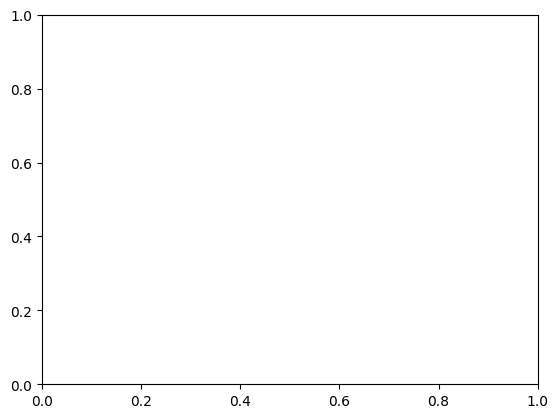

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1263671250825263>, line 1
----> 1 plt.plot(df['minute_game'], df['score_margin_complete'], label="score_margin_complete")
      2 plt.plot(df['minute_game'], df['predictions'], label="predictions")
      4 plt.show()

File /databricks/python/lib/python3.10/site-packages/matplotlib/pyplot.py:2769, in plot(scalex, scaley, data, *args, **kwargs)
   2767 @_copy_docstring_and_deprecators(Axes.plot)
   2768 def plot(*args, scalex=True, scaley=True, data=None, **kwargs):
-> 2769     return gca().plot(
   2770         *args, scalex=scalex, scaley=scaley,
   2771         **({"data": data} if data is not None else {}), **kwargs)

File /databricks/python/lib/python3.10/site-packages/matplotlib/axes/_axes.py:1632, in Axes.plot(self, scalex, scaley, data, *args, **kwargs)
   1390 """
   1391 Plot y versus x as lines and/or markers.
   

In [0]:

plt.plot(df['minute_game'], df['score_margin_complete'], label="score_margin_complete")
plt.plot(df['minute_game'], df['predictions'], label="predictions")

plt.show()

In [0]:
display(test_orig)

period,minute_game,score_margin_complete,month,day,year,momentum_40,event_type_1,event_type_2,event_type_3,event_type_4,event_type_5,event_type_6,event_type_7,event_type_8,event_type_9,event_type_10,event_type_11,event_type_12,event_type_13,event_type_18,away_team_atlanta_hawks,away_team_boston_celtics,away_team_brooklyn_nets,away_team_charlotte_hornets,away_team_chicago_bulls,away_team_cleveland_cavaliers,away_team_dallas_mavericks,away_team_denver_nuggets,away_team_detroit_pistons,away_team_golden_state_warriors,away_team_houston_rockets,away_team_indiana_pacers,away_team_los_angeles_clippers,away_team_los_angeles_lakers,away_team_memphis_grizzlies,away_team_miami_heat,away_team_milwaukee_bucks,away_team_minnesota_timberwolves,away_team_new_orleans_pelicans,away_team_new_york_knicks,away_team_oklahoma_city_thunder,away_team_orlando_magic,away_team_philadelphia_76ers,away_team_phoenix_suns,away_team_portland_trail_blazers,away_team_sacramento_kings,away_team_san_antonio_spurs,away_team_utah_jazz,away_team_washington_wizards,predictions
4,36.0,4,1,21,2022,-1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.09011225290317582
4,36.22,1,1,21,2022,-4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155
4,37.4,-2,1,21,2022,-7,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155
4,38.05,-3,1,21,2022,-10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155
4,38.43,-3,1,21,2022,-10,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155
4,38.48,-3,1,21,2022,-10,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155
4,38.55,-1,1,21,2022,-8,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155
4,38.78,-1,1,21,2022,-6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155
4,38.9,-1,1,21,2022,-5,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155
4,39.22,-3,1,21,2022,-7,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-4.556861346900155


### Save Results to Catalog

In [0]:
feature_spark = spark.createDataFrame(feature_preds[['game_id', 'event_num', 'minute_game', 'score_margin_complete', 'predictions']])
feature_spark.write.mode("overwrite").saveAsTable("hackathon.example_schema.ml_results")